# Análisis Exploratorio de Datos (EDA)

## El problema

Se requiere realizar un análisis profundo a un conjunto de datos a fin de presentar una propuesta de posibles    **<span style="color:darkgreen">inversiones en criptomonedas</span>**, para este proyecto se requeria la ingesta de datos de varias fuentes especializadas en la materia y se debe realizar un trabajo de  **Data Analytics** para presentar la propuesta.

Una vez realizadas las tareas de Extracción, Transformación y Carga de los datos de las fuentes seleccionadas, y que puede encontrar en el siguiente enlcace [E.T.L](ETL-(Extract-Transform-Load).ipynb), resultó en un datasets el cual será objeto de el presente análisis.

## Análisis exploratorio

El primer paso en este análisis es entender las variables de nuestro dataset:

##### El set de datos.

La información una vez procesada se encuentra en un CSV (`crypto_fact_table.csv`) con 24.585 filas y 7 columnas.

Cada registro contiene xx características Las columnas son las siguientes:

1. **date**: Fecha de transacción.
2. **name**: Nombre de la criptomoneda.
3. **prices**: Precio de cierre para el día del activo.
4. **daily_return**: Retorno diario del activo.
5. **market_caps**: Capitalización de mercado del activo.
6. **global_cap**: Capitalización global del mercado de criptomonedas.
7. **market_share**: Porcentaje de la porción del aporte del mercado.

## Lectura de Datos

In [1]:
# # Importar librerías necesarias
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.dates import YearLocator
import matplotlib.ticker as mtick

import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot
from plotly.graph_objs import *
import plotly.io as pio
pio.renderers.default = 'notebook'
init_notebook_mode(connected=True)  

from datetime import datetime, timedelta

In [2]:
# Carga de de set de datos
df = pd.read_csv('datasets/crypto_fact_table.csv')
df.sample(5)

,date,name,prices,daily_return,market_caps,global_cap,market_share
24370,2023-01-20,Tron,0.060198,0.017280,5.530229e+09,1.070280e+12,0.516709
9861,2022-06-19,Ethereum,995.252569,-0.085089,1.201489e+11,9.495050e+11,12.653847
23177,2019-10-15,Tron,0.016685,0.036976,1.101605e+09,2.182050e+11,0.504849
11932,2018-01-09,Litecoin,258.719965,-0.019058,1.414850e+10,7.771640e+11,1.820529
1993,2023-06-18,Binancecoin,244.426681,0.022551,3.809898e+10,1.157070e+12,3.292712


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24584 entries, 0 to 24583
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          24584 non-null  object 
 1   name          24584 non-null  object 
 2   prices        24584 non-null  float64
 3   daily_return  24571 non-null  float64
 4   market_caps   24584 non-null  float64
 5   global_cap    24584 non-null  float64
 6   market_share  24584 non-null  float64
dtypes: float64(5), object(2)
memory usage: 1.3+ MB


In [4]:
# Chequeando valores nulos por cada columna en porcentaje
df.isnull().sum()*100/df.shape[0]

date            0.00000
name            0.00000
prices          0.00000
daily_return    0.05288
market_caps     0.00000
global_cap      0.00000
market_share    0.00000
dtype: float64

**Observaciones Iniciales**<br>
El set de datos presenta las siguientes características:
1. Numero de Filas (Registros): 24.584
2. Número de columnas : 7
3. Tipos de datos: float64(5), object(2)
4. Datos faltantes: columna `daily_return` 13 (0.05288 %)
5. Uso de Memoria: 1.3 MB

Hay que poner atención en el manejo de valores faltantes en la columna `daily_return` y en el tipo de datos de la columna `date` debe ser datetime.

## Procesamiento inicial del dataset

El primer paso consiste en convertir la columna `date` del formato object (string + datos numéricos) al formato datetime.

Esto facilitará la visualización del set de datos y el análisis exploratorio, así como el pre-procesamiento:

In [5]:
# Pasar la columna "date" al formato datetime
df['date'] = pd.to_datetime(df['date'], format = '%Y-%m-%d')

# Fijemos esta nueva columna como índice del DataFrame
df = df.set_index('date')

# Ordenemos el dataset de forma ascendente según "date"
df.sort_index(inplace=True)
df.sort_values('date')
df

,name,prices,daily_return,market_caps,global_cap,market_share
date,,,,,,
2018-01-02,Binancecoin,9.090393,NaN,9.000762e+08,7.033260e+11,0.127974
2018-01-02,Dogecoin,0.009335,NaN,1.051233e+09,7.033260e+11,0.149466
2018-01-02,Ethereum,876.890259,NaN,8.482222e+10,7.033260e+11,12.060157
2018-01-02,Litecoin,255.048185,NaN,1.392244e+10,7.033260e+11,1.979514
2018-01-02,Bitcoin,15321.932852,NaN,2.570796e+11,7.033260e+11,36.551985
...,...,...,...,...,...,...
2023-08-21,Tether,0.999208,-0.001035,8.276435e+10,1.097100e+12,7.543920
2023-08-21,Dogecoin,0.063744,0.000154,8.964638e+09,1.097100e+12,0.817121
2023-08-21,Cardano,0.270308,0.007911,9.483518e+09,1.097100e+12,0.864417


#### Reemplazar los valores faltantes:

Para el remplazo de valores faltantes se toma la premisa que estos valores son el resultado de una columna calculada retorno diario calculado con los valores (valor actual-valor inicial)/valor inicial el primer cálculo arroja como resultado NaN por que no existe valor anterior, Manteniendo la filosofía del concepto de retorno diario se asignara valor cero (0) a estas celdas ya que no se obtuvo ningún retorno para el día inicial.

In [6]:
df['daily_return'].fillna(0, inplace=True)
df.head()

,name,prices,daily_return,market_caps,global_cap,market_share
date,,,,,,
2018-01-02,Binancecoin,9.090393,0.0,9.000762e+08,7.033260e+11,0.127974
2018-01-02,Dogecoin,0.009335,0.0,1.051233e+09,7.033260e+11,0.149466
2018-01-02,Ethereum,876.890259,0.0,8.482222e+10,7.033260e+11,12.060157
2018-01-02,Litecoin,255.048185,0.0,1.392244e+10,7.033260e+11,1.979514
2018-01-02,Bitcoin,15321.932852,0.0,2.570796e+11,7.033260e+11,36.551985


In [7]:
# Verificamos de nuevo para asegurarnos que los valores faltantes fuerón corregidos.
df.isnull().sum()*100/df.shape[0]

name            0.0
prices          0.0
daily_return    0.0
market_caps     0.0
global_cap      0.0
market_share    0.0
dtype: float64

#### Garantizar que la periodicidad de las muestras es exactamente de 1 día

Por tratarce de un set de datos es una serie temporal los datos deben cumplir ciertas condiciones:
1. Encontrarse ordenados por la variable de tiempo, en este caso date
2. Las periodicidad de las muestras por cada uno de las cryptomonedas debe ser la misma.

In [8]:
# Verificar si la periodicidad de las muestras es exactamente 1 día (86.400 secs) para cada crypto en el datasets
for cry in df['name'].unique().tolist():
    print('Periocidad en segúndos para: ', cry)
    print('*' * 40)
    df_time_diffs = df[df['name'] == cry].index.to_series().diff().dt.total_seconds()
    print(df_time_diffs.value_counts())
    print('*' * 40)
    print()

Periocidad en segúndos para:  Binancecoin
****************************************
date
86400.0    2057
Name: count, dtype: int64
****************************************

Periocidad en segúndos para:  Dogecoin
****************************************
date
86400.0    2057
Name: count, dtype: int64
****************************************

Periocidad en segúndos para:  Ethereum
****************************************
date
86400.0    2057
Name: count, dtype: int64
****************************************

Periocidad en segúndos para:  Litecoin
****************************************
date
86400.0    2057
Name: count, dtype: int64
****************************************

Periocidad en segúndos para:  Bitcoin
****************************************
date
86400.0    2057
Name: count, dtype: int64
****************************************

Periocidad en segúndos para:  Ripple
****************************************
date
86400.0    2057
Name: count, dtype: int64
****************************

**Observaciones**:<br>
Cada una de las diferentes cryptomonedas tienen una periodicidad de **86.400 segundos exaptos** lo que indica que que la frecuencia de la anotación es de un día para todas y cada una de las diferentes cryptos

## Análisis gráfico del data Frame
En el próximo apartado se realizará un análisis con gráficos de interes para evaluar diferentes aspectos de las criptomonedas seleccionadas, vale la pena mensionar que el set de datos se encuentra la información de trece (13) diferentes monedas por un período de tiempo máximo de 2035 días.

#### Comportamiento histórico del precio y tendencia

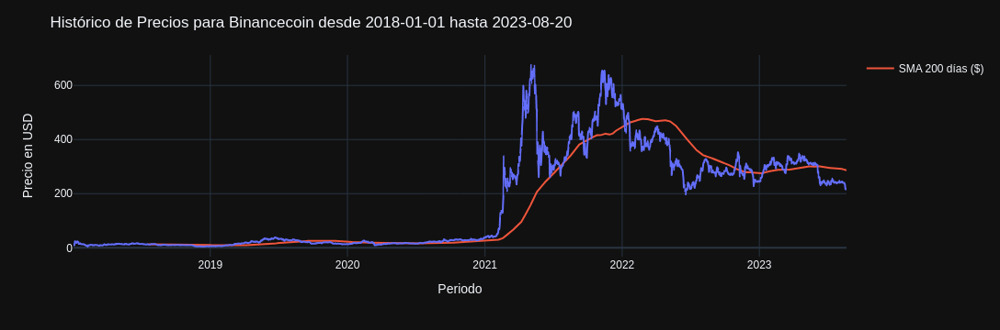

Precio Inicial del Rango: 9.09 $
Precio Mínimo del Rango: 4.47 $
Precio Máximo del Rango: 675.1 $
Precio Actual: 216.24 $
********************************************************************************



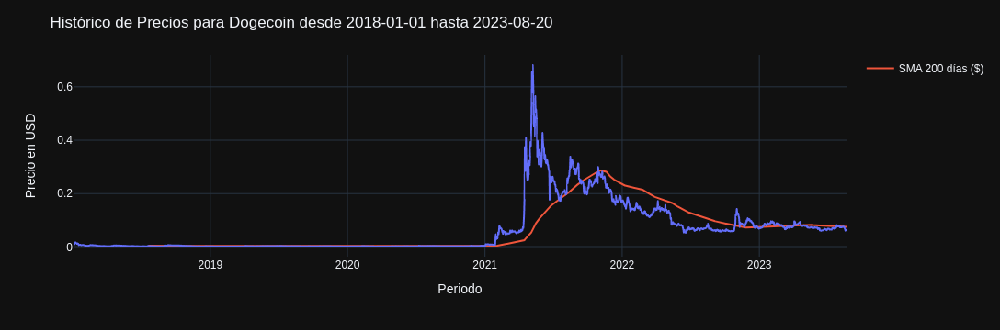

Precio Inicial del Rango: 0.01 $
Precio Mínimo del Rango: 0.0 $
Precio Máximo del Rango: 0.68 $
Precio Actual: 0.06 $
********************************************************************************



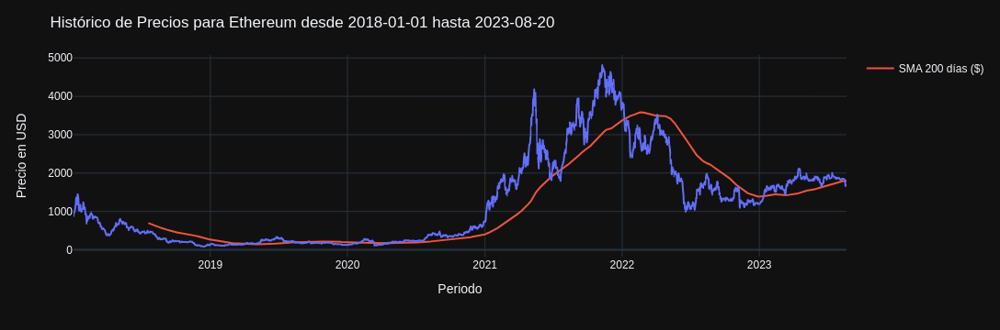

Precio Inicial del Rango: 876.89 $
Precio Mínimo del Rango: 83.79 $
Precio Máximo del Rango: 4815.0 $
Precio Actual: 1682.46 $
********************************************************************************



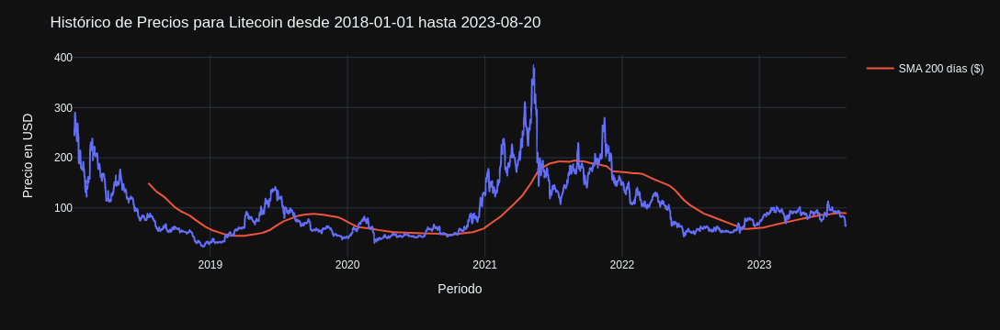

Precio Inicial del Rango: 255.05 $
Precio Mínimo del Rango: 23.06 $
Precio Máximo del Rango: 384.67 $
Precio Actual: 65.16 $
********************************************************************************



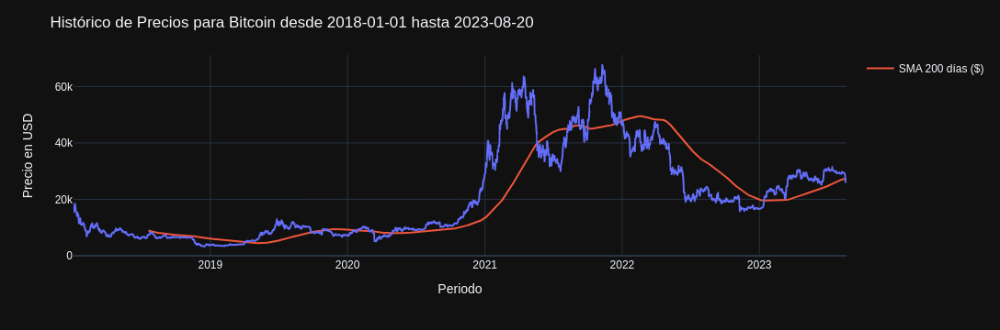

Precio Inicial del Rango: 15321.93 $
Precio Mínimo del Rango: 3216.63 $
Precio Máximo del Rango: 67617.02 $
Precio Actual: 26160.7 $
********************************************************************************



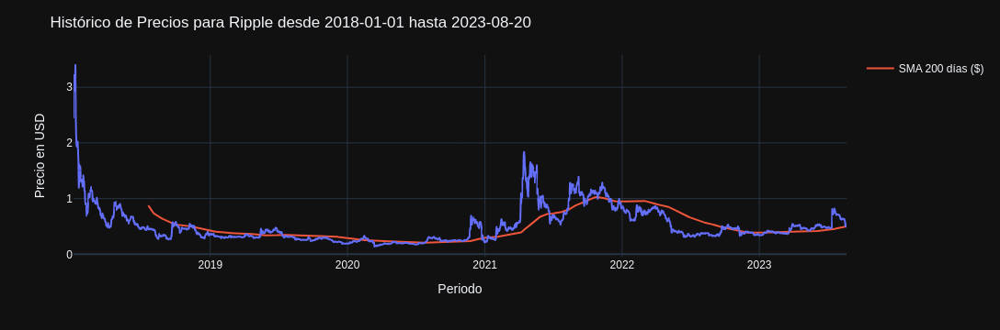

Precio Inicial del Rango: 2.46 $
Precio Mínimo del Rango: 0.14 $
Precio Máximo del Rango: 3.4 $
Precio Actual: 0.54 $
********************************************************************************



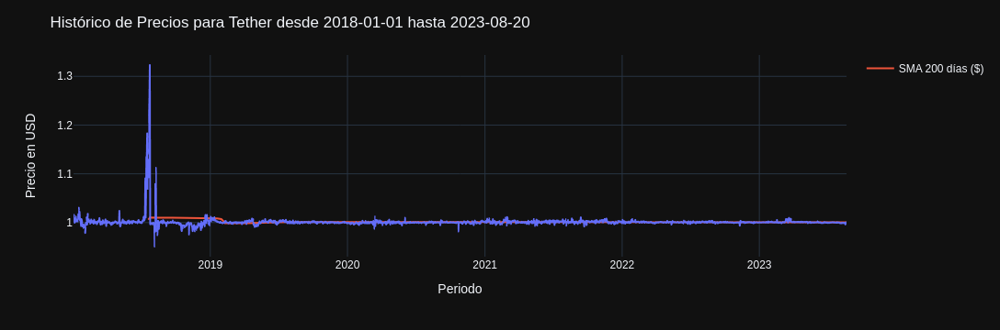

Precio Inicial del Rango: 1.0 $
Precio Mínimo del Rango: 0.95 $
Precio Máximo del Rango: 1.32 $
Precio Actual: 1.0 $
********************************************************************************



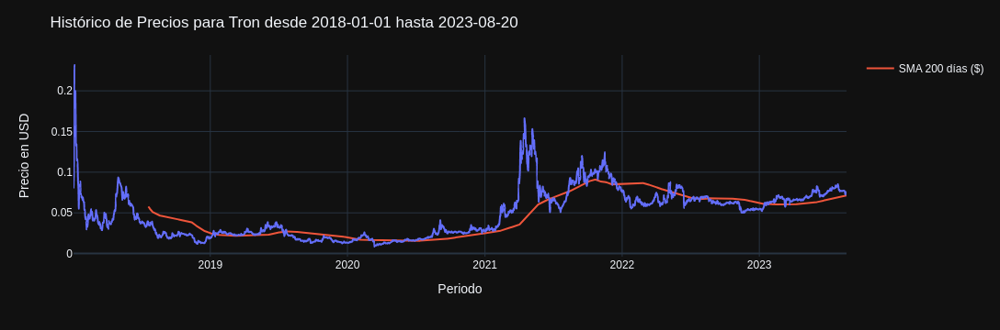

Precio Inicial del Rango: 0.08 $
Precio Mínimo del Rango: 0.01 $
Precio Máximo del Rango: 0.23 $
Precio Actual: 0.08 $
********************************************************************************



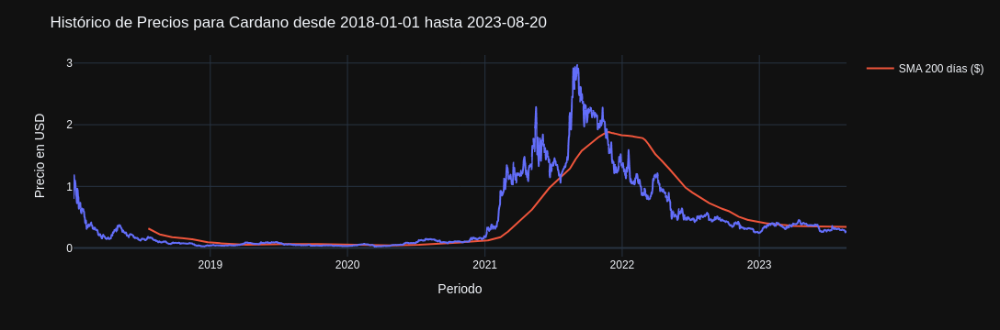

Precio Inicial del Rango: 0.81 $
Precio Mínimo del Rango: 0.02 $
Precio Máximo del Rango: 2.97 $
Precio Actual: 0.27 $
********************************************************************************



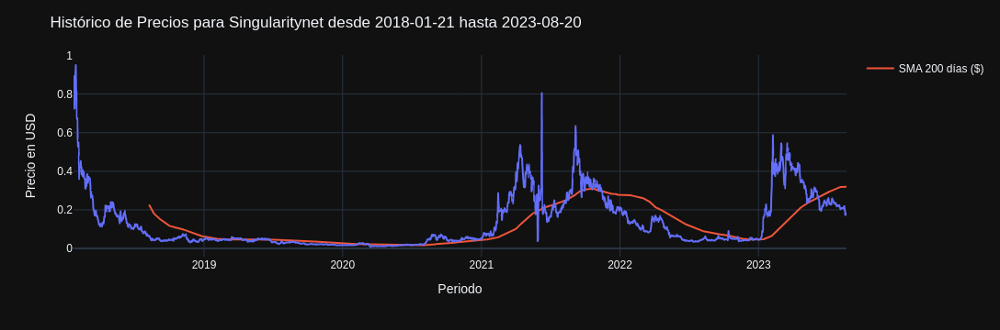

Precio Inicial del Rango: 0.89 $
Precio Mínimo del Rango: 0.01 $
Precio Máximo del Rango: 0.95 $
Precio Actual: 0.18 $
********************************************************************************



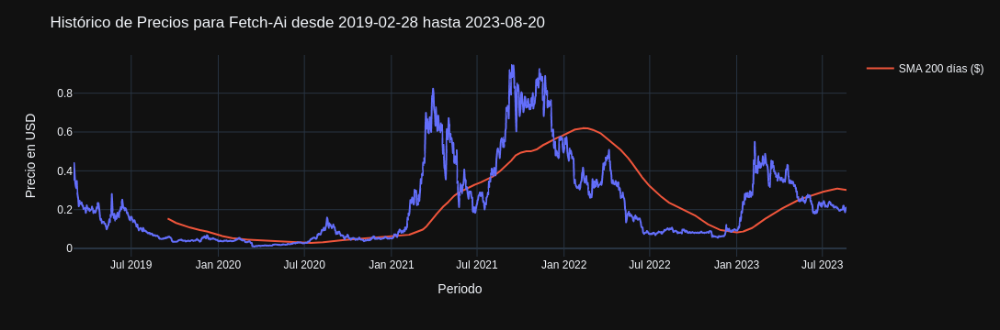

Precio Inicial del Rango: 0.35 $
Precio Mínimo del Rango: 0.01 $
Precio Máximo del Rango: 0.94 $
Precio Actual: 0.2 $
********************************************************************************



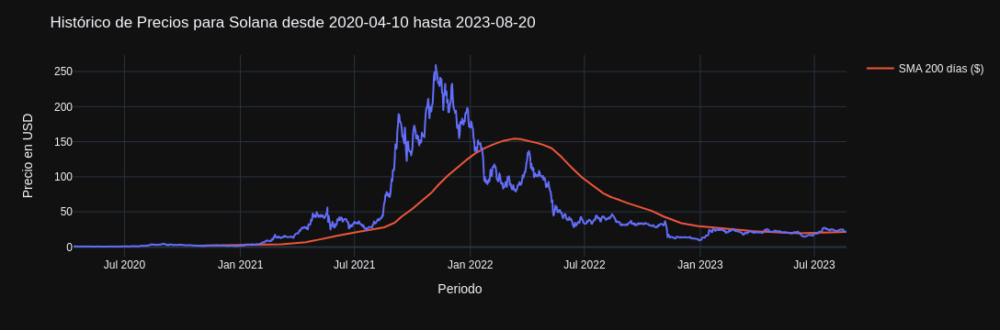

Precio Inicial del Rango: 0.96 $
Precio Mínimo del Rango: 0.51 $
Precio Máximo del Rango: 259.24 $
Precio Actual: 21.75 $
********************************************************************************



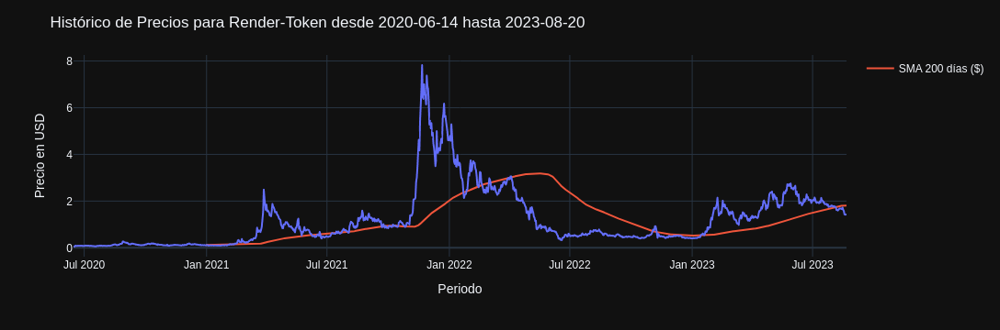

Precio Inicial del Rango: 0.05 $
Precio Mínimo del Rango: 0.05 $
Precio Máximo del Rango: 7.83 $
Precio Actual: 1.43 $
********************************************************************************



In [9]:
df.index = pd.to_datetime(df.index)
    
for cry in df['name'].unique().tolist():
    df_cry = df[df['name'] == cry]
    min_date = datetime.fromtimestamp(df_cry.index.min().timestamp()).strftime('%Y-%m-%d')
    max_date = datetime.fromtimestamp(df_cry.index.max().timestamp()).strftime('%Y-%m-%d')
    min_price = df_cry['prices'].min()
    max_price = df_cry['prices'].max()
    ini_price = df_cry.prices.iloc[0]
    end_price = df_cry.prices.iloc[-1]

    # calcular la media móvil de 200 días
    ma_200 = df_cry['prices'].rolling(window=200).mean()
    
    fig = px.line(df_cry, x=df_cry.index, y='prices')
    # agregar la serie de la media móvil de 200 días
    fig.add_trace(go.Scatter(x=df_cry.index, y=ma_200, name='SMA 200 días ($)'))
    fig.update_layout(title=f'Histórico de Precios para {cry} desde {min_date} hasta {max_date}', xaxis_title='Periodo',
                      yaxis_title='Precio en USD', template='plotly_dark')
    fig.show()

    print(f'Precio Inicial del Rango: {round(ini_price,2)} $')
    print(f'Precio Mínimo del Rango: {round(min_price,2)} $')
    print(f'Precio Máximo del Rango: {round(max_price,2)} $')
    print(f'Precio Actual: {round(end_price,2)} $')
    print('*' * 80)
    print()

### Observaciones:
**Comportamiento de la cryptomoneda durante el período de estudio**<br>

En general la mayoría de los activos evaluados presentan un comportamiento similar, desde el inicio se mantiene el precio en un rango estable para luego en el año 2021 comienza una explosión a la alsa, donde la mayoría alcansó, los máximos del período en estudio para luego tomar una tendencia bajista corrigiendo el precio. Nuevamente a principios de 2023 retoma una tendencia alsista prudente que va permanentemente buscado la media móvil simple de 200 períodos.

El `Tether` sale del patrón indicado ya que mantiene de manera continua un precio estable de 1 $ durante el período siendo fiel a la filosofia de su uso que es mantener un valor de 1 a 1 con la moneda FIAT Dolar es decir un Tether un Dolar.


<details>
  <summary>
    Crypto: <span style="color:darkblue">Binancecoin</span> | Datos Observados en el período desde 2018-01-01 hasta 2023-08-20
      
  </summary>
    
    Precio de Inicio: 9.09 US$
    
    Precio Minímo: 4.47 US$
    
    Precio Máximo: 675.1 US$
    
    Precio Actual: 216.24 US$

    Tendencia actual: Bajista (Por debajo de la media de 200 períodos)
</details>

<details>
  <summary>
    Crypto: <span style="color:darkblue">Dogecoin</span> | Datos Observados en el período desde 2018-01-01 hasta 2023-08-20
      
  </summary>
    
    Precio de Inicio: 0.01 US$
    
    Precio Minímo: 0.00 US$
    
    Precio Máximo: 0.68 US$
    
    Precio Actual: 0.06 US$

    Tendencia actual: Bajista (Por debajo de la media de 200 períodos)
</details>

<details>
  <summary>
    Crypto: <span style="color:darkblue">Ethereum</span> | Datos Observados en el período desde 2018-01-01 hasta 2023-08-20
      
  </summary>
    
    Precio de Inicio: 876.89 US$
    
    Precio Minímo: 83.79 US$
    
    Precio Máximo: 4815.00 US$
    
    Precio Actual: 1682.00 US$

    Tendencia actual: Rango Alsista
</details>

<details>
  <summary>
    Crypto: <span style="color:darkblue">Litecoin</span> | Datos Observados en el período desde 2018-01-01 hasta 2023-08-20
      
  </summary>
    
    Precio de Inicio: 255.05 US$
    
    Precio Minímo: 23.06 US$
    
    Precio Máximo: 384.67 US$
    
    Precio Actual: 65.16 US$

    Tendencia actual: Rango sin Tendencia definida
</details>

<details>
  <summary>
    Crypto: <span style="color:darkblue">Bitcoin</span> | Datos Observados en el período desde 2018-01-01 hasta 2023-08-20
      
  </summary>
    
    Precio de Inicio: 15321.93 US$
    
    Precio Minímo: 3216.63 US$
    
    Precio Máximo: 67617.02 US$
    
    Precio Actual: 26160.70 US$

    Tendencia actual: Rango Alsista
</details>

<details>
  <summary>
    Crypto: <span style="color:darkblue">Ripple</span> | Datos Observados en el período desde 2018-01-01 hasta 2023-08-20
      
  </summary>
    
    Precio de Inicio: 2.46 US$
    
    Precio Minímo: 0.14 US$
    
    Precio Máximo: 3.40 US$
    
    Precio Actual: 0.54 US$

    Tendencia actual: Rango Alsista
</details>

<details>
  <summary>
    Crypto: <span style="color:darkblue">Tether</span> | Datos Observados en el período desde 2018-01-01 hasta 2023-08-20
      
  </summary>
    
    Precio de Inicio: 1.00 US$
    
    Precio Minímo: 0.95 US$
    
    Precio Máximo: 1.32 US$
    
    Precio Actual: 1 US$

    Tendencia actual: Rango sin Tendencia
</details>

<details>
  <summary>
    Crypto: <span style="color:darkblue">Tron</span> | Datos Observados en el período desde 2018-01-01 hasta 2023-08-20
      
  </summary>
    
    Precio de Inicio: 0.08 US$
    
    Precio Minímo: 0.01 US$
    
    Precio Máximo: 0.23 US$
    
    Precio Actual: 0.08 US$

    Tendencia actual: Rango alsista
</details>

<details>
  <summary>
    Crypto: <span style="color:darkblue">Cardano</span> | Datos Observados en el período desde 2018-01-01 hasta 2023-08-20
      
  </summary>
    
    Precio de Inicio: 0.81 US$
    
    Precio Minímo: 0.02 US$
    
    Precio Máximo: 2.97 US$
    
    Precio Actual: 0.27 US$

    Tendencia actual: Rango alsista
</details>

<details>
  <summary>
    Crypto: <span style="color:darkblue">Singularitynet</span> | Datos Observados en el período desde 2018-01-21 hasta 2023-08-20
      
  </summary>
    
    Precio de Inicio: 0.89 US$
    
    Precio Minímo: 0.01 US$
    
    Precio Máximo: 0.95 US$
    
    Precio Actual: 0.18 US$

    Tendencia actual: Bajista
</details>

<details>
  <summary>
    Crypto: <span style="color:darkblue">Fetch-AI</span> | Datos Observados en el período desde 2019-02-28 hasta 2023-08-20
      
  </summary>
    
    Precio de Inicio: 0.35 US$
    
    Precio Minímo: 0.01 US$
    
    Precio Máximo: 0.94 US$
    
    Precio Actual: 0.20 US$

    Tendencia actual: Bajista
</details>

<details>
  <summary>
    Crypto: <span style="color:darkblue">Solana</span> | Datos Observados en el período desde 2020-04-10 hasta 2023-08-20
      
  </summary>
    
    Precio de Inicio: 0.96 US$
    
    Precio Minímo: 0.51 US$
    
    Precio Máximo: 259 US$
    
    Precio Actual: 21.75 US$

    Tendencia actual: Rango
</details>

<details>
  <summary>
    Crypto: <span style="color:darkblue">Render-Token</span> | Datos Observados en el período desde 2020-06-14 hasta 2023-08-20
      
  </summary>
    
    Precio de Inicio: 0.05 US$
    
    Precio Minímo: 0.05 US$
    
    Precio Máximo: 7.83 US$
    
    Precio Actual: 1.43 US$

    Tendencia actual: Rango Alsista
</details>



#### Revalorización en lo que va de año YTD% (Year to date)

El indicador **YTD% (yeart to date)** es un indicador de **rentabilidad** que mide el rendimiento de un activo en lo que va de año, se calcula así: ((valor actual)- (valor inicial)/ valor inicial x 100)

In [10]:
YTD = {'crypto':[],
       'ytd':[]
      }
for cry in df['name'].unique().tolist():
    df_2023 = df.loc['2023-01-01':]
    df_2023 = df_2023[df_2023['name'] == cry]

    ini_price = df_2023.prices.iloc[0]
    end_price = df_2023.prices.iloc[-1]
    
    value = ((end_price - ini_price) / ini_price) * 100

    YTD['crypto'].append(cry)
    YTD['ytd'].append(value)

ytd_df = pd.DataFrame(YTD).sort_values('ytd', ascending=False)
ytd_df

,crypto,ytd
9,Singularitynet,298.922913
12,Render-Token,255.273809
10,Fetch-Ai,121.933957
11,Solana,118.316699
5,Ripple,58.498484
4,Bitcoin,58.159634
2,Ethereum,40.601994
7,Tron,38.995037
8,Cardano,9.703499
6,Tether,-0.091822


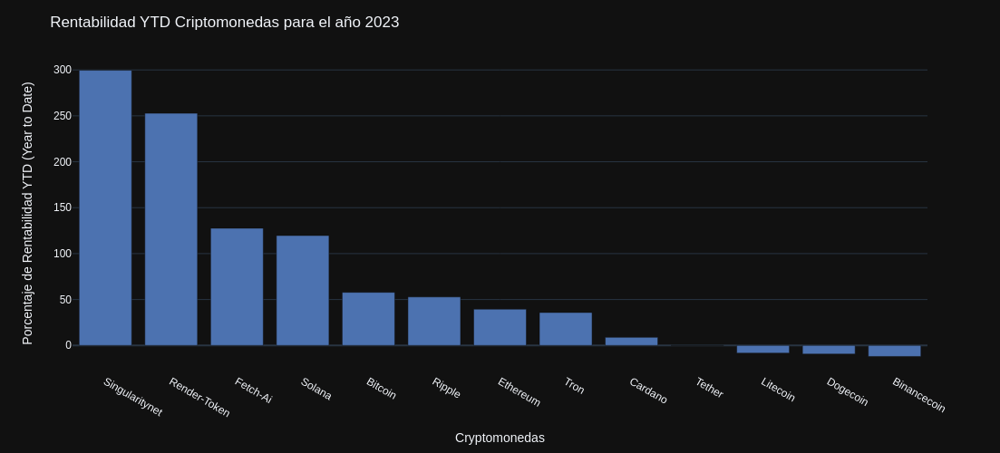

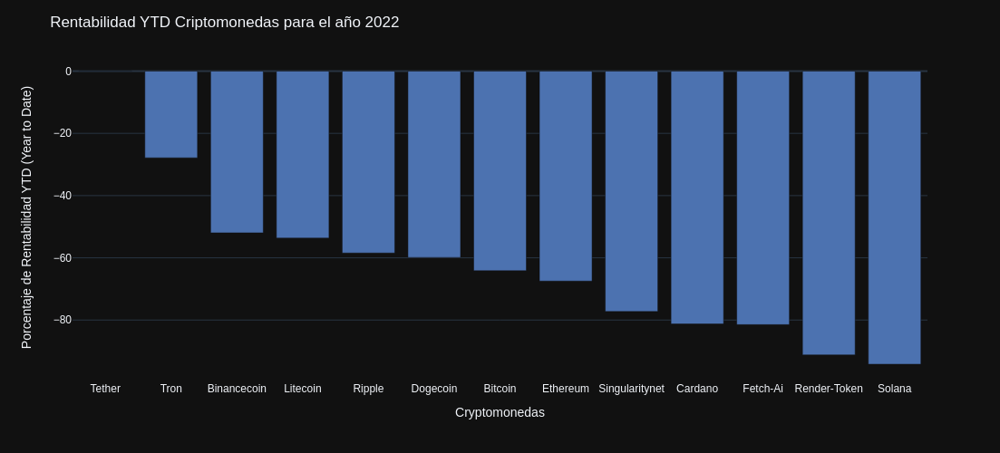

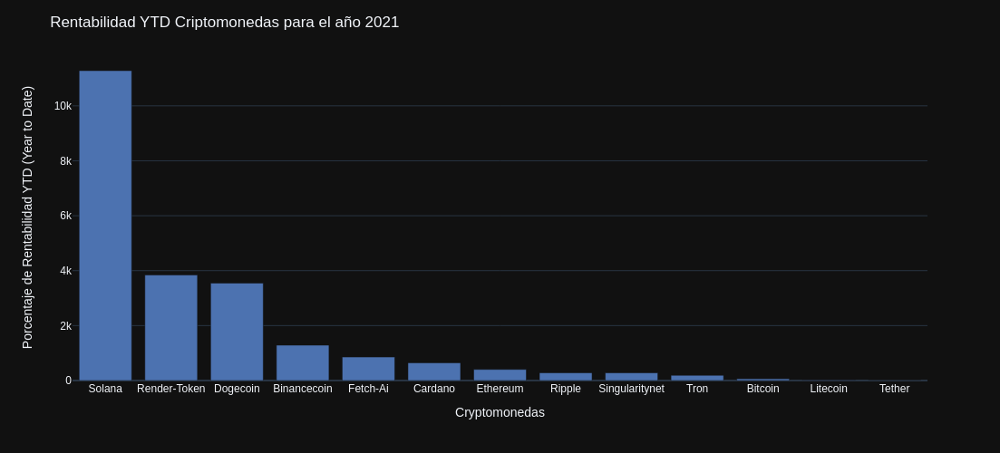

In [11]:
for date_cal in [('2023-01-01','2023-08-20'), ('2022-01-01', '2022-12-31'), ('2021-01-01', '2021-12-31')]:
    YTD = {'year':[],
           'crypto':[],
           'ytd':[]
          }
    for cry in df['name'].unique().tolist():
        df_year = df.loc[date_cal[0]:date_cal[1]]
        df_year = df_year[df_year['name'] == cry]
    
        ini_price = df_year.prices.iloc[0]
        end_price = df_year.prices.iloc[-1]
        
        value = ((end_price - ini_price) / ini_price) * 100
    
        YTD['year'].append(date_cal[0].split("-")[0])
        YTD['crypto'].append(cry)
        YTD['ytd'].append(value)
    
    ytd_df = pd.DataFrame(YTD).sort_values('ytd', ascending=False)
    
    fig = px.bar(ytd_df, x= 'crypto', y= 'ytd', template='seaborn')
    fig.update_traces(hovertemplate='<b>Cryptomonedas: %{x}</b><br>Cantidad: %{y}')
    fig.update_layout(xaxis={'title': 'Cryptomonedas'},
                      yaxis={'title': 'Porcentaje de Rentabilidad YTD (Year to Date)'},
                      title= f'Rentabilidad YTD Criptomonedas para el año {date_cal[0].split("-")[0]}',
                      template='plotly_dark',
                      height=500, width=1100)
    fig.show()

#### Observaciones:
**Comportamiento de la cryptomoneda en cuanto a la rentabilidad por año**<br>
El Indicador YTD (Year to Date) muestra la **Rentabilidad** del activo en lo que va de año, es decir desde el primer día del año hasta la fecha actua, sin embargo, se realizó.

**Año 2023**: El gráfico muestra las criptomonedas que han tenido una mayor revalorización, es decir, qué criptomonedas son más rentables. las principales que salen se deben al boom de la Inteligencia artificial.

Para una comparación del comportamiento en años anteriores se grafican la rentabilidad de cada activo para los años 2022 y 2021.

### Capitalización de Mercado
El indicador que mide y sigue el valor de mercado de una criptomoneda es la **Capitalización del Mercado** se utiliza como indicador de preponderancia y popularidad de las criptomonedas. Se basa en  el valor total de todas las monedas y se calcula a multiplicando la cantidad de criptomonedas en circulación por el precio de mercado actual de una única moneda.

In [12]:
df_cap = df[['name', 'market_caps', 'market_share']]
df_cap

,name,market_caps,market_share
date,,,
2018-01-02,Binancecoin,9.000762e+08,0.127974
2018-01-02,Dogecoin,1.051233e+09,0.149466
2018-01-02,Ethereum,8.482222e+10,12.060157
2018-01-02,Litecoin,1.392244e+10,1.979514
2018-01-02,Bitcoin,2.570796e+11,36.551985
...,...,...,...
2023-08-21,Tether,8.276435e+10,7.543920
2023-08-21,Dogecoin,8.964638e+09,0.817121
2023-08-21,Cardano,9.483518e+09,0.864417


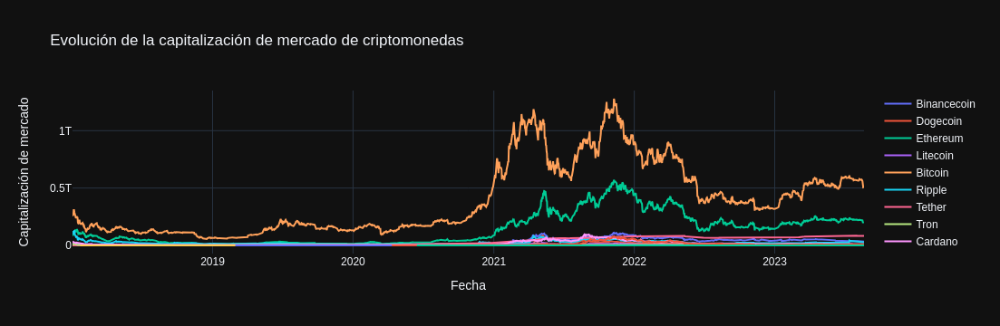

In [13]:
fig = go.Figure()

# Recorrer cada criptomoneda en el DataFrame y agregarla al gráfico
for criptomoneda in df_cap['name'].unique():
    df_cripto = df_cap[df_cap['name'] == criptomoneda]
    fig.add_trace(go.Scatter(x=df_cripto.index, y=df_cripto['market_caps'], name=criptomoneda))

# Personalizar el gráfico
fig.update_layout(
    title='Evolución de la capitalización de mercado de criptomonedas',
    xaxis_title='Fecha',
    yaxis_title='Capitalización de mercado',
    template='plotly_dark'
)

# Mostrar el gráfico
fig.show()

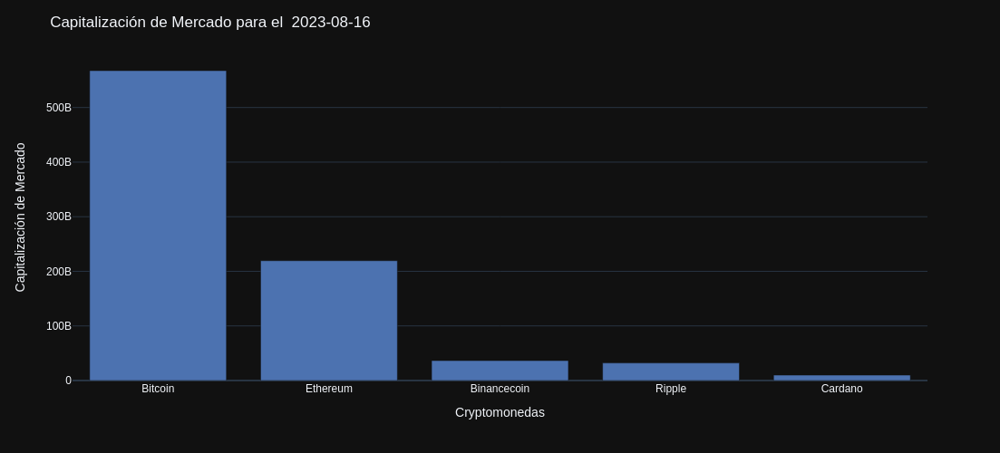

In [14]:
date_mc = '2023-08-16'

top_5 = df_cap.groupby('name')['market_caps'].max().sort_values(ascending=False)[:5].index
df_top_5 = df_cap[df_cap['name'].isin(top_5)].loc[date_mc].sort_values('market_caps', ascending=False)

fig = px.bar(df_top_5, x= 'name', y= 'market_caps', template='seaborn')
fig.update_traces(hovertemplate='<b>Cryptomonedas: %{x}</b><br>Capitalización: %{y}')
fig.update_layout(xaxis={'title': 'Cryptomonedas'},
                  yaxis={'title': 'Capitalización de Mercado'},
                  title= f'Capitalización de Mercado para el  {date_mc}',
                  template='plotly_dark',
                  height=500, width=1100)

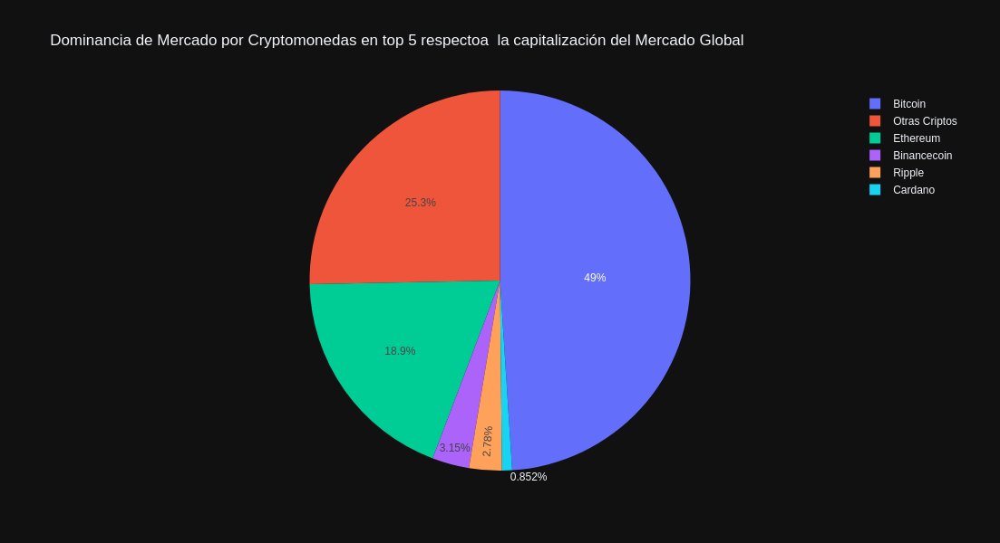

In [16]:
# Preparación de datos par grafico de torta
total_coins = df_top_5['market_share'].sum()
values = df_top_5['market_share'].tolist()
values.append(100-total_coins)
names = df_top_5['name'].tolist()
names.append('Otras Criptos')

df_pie = pd.DataFrame(list(zip(names, values)),
               columns =['name', 'value'])

fig = px.pie(df_pie, values='value', names='name', title='Dominancia de Mercado por Cryptomonedas en top 5 respectoa  la capitalización del Mercado Global',
             width=1100, height=600, template='plotly_dark')
fig.show()

#### Observaciones:
**Comportamiento de la cryptomoneda en cuanto a la capitalización de Mercado**<br>
Es posible que no vayan a ser las Crypto monedas que más se revaloricen, pero seguro que ganan mucho valor y sobre todo son las más seguras y las que tienen perspectiva de seguir formando parte de las más importantes dentro de mucho tiempo.

1. El primer gráfico se muestra como fué la evolución histórica de la capitalización de las cryptomonedas objeto de este estudio donde se observa la preponderancia del **Bitcoin** durante todos los períodos, seguido por el **Ethereum** y muy por debajo el resto de las monedas criptográficas.
2. El segundo gráfico muestra una comparativa de las cinco mejores cryptos en cuanto al indicador en estudio haciendose mas evidente la fortaleza del **Bitcoin** con respecto al resto.
3. El tercer grafico muestra el indicador **aporte a la Capitalización del Mercado Global** de cada una de las cryptos monedas pertenecientes al Top 5 de ahi se desprende que:
    * **Bitcoin** realiza un aporte del 49% del total del mercado siendo la cryptomoneda mas fuerte del ecosistema.
    * **Otras Criptos** se refiere a el resto de criptomonedas que no se han tomado en cuenta en este estudio se trata de aproximadamente de mas de 10 mil 100 diferentes activos criptográficos. su aporte es del 25.3 % incluyendo las criptomonedas en estudio que quedaron fuera del top 5
    * **Ethereum** realiza un aporte del 18.9% siendo la segúnda del estudio solo por detras de Bitcoin.

### Volatilidad

**La volatilidad implícita** es una medida de las expectativas del mercado sobre la volatilidad futura de un activo subyacente, como una acción, un índice o una divisa. Esta medida se calcula a partir del precio de mercado de las opciones sobre el activo subyacente, utilizando un modelo matemático para estimar la volatilidad que se deriva del precio de estas opciones.

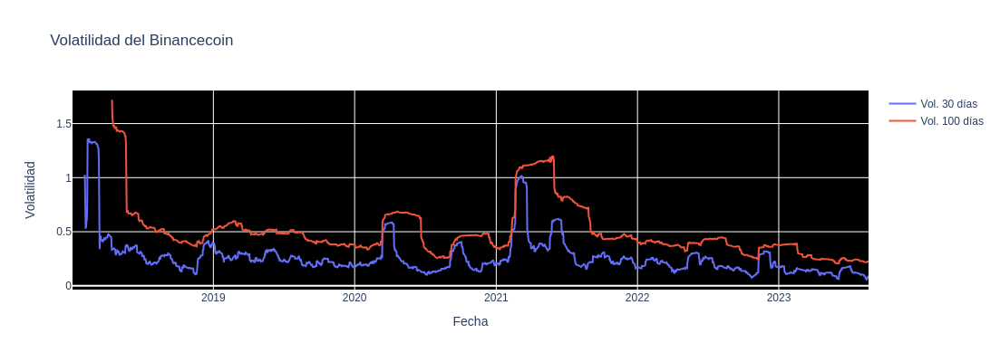

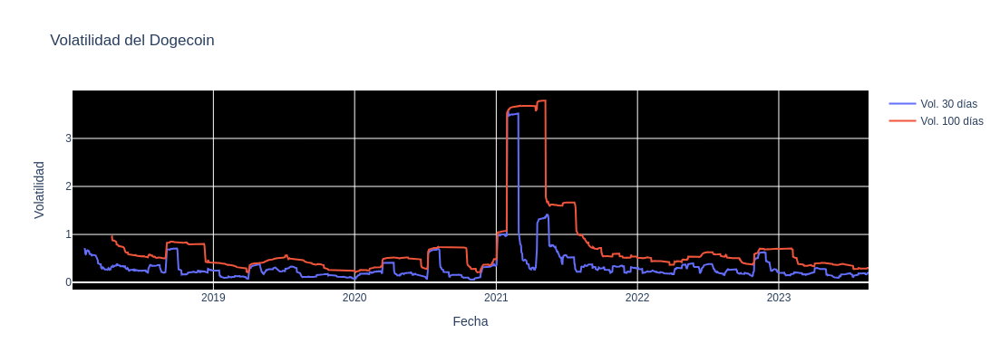

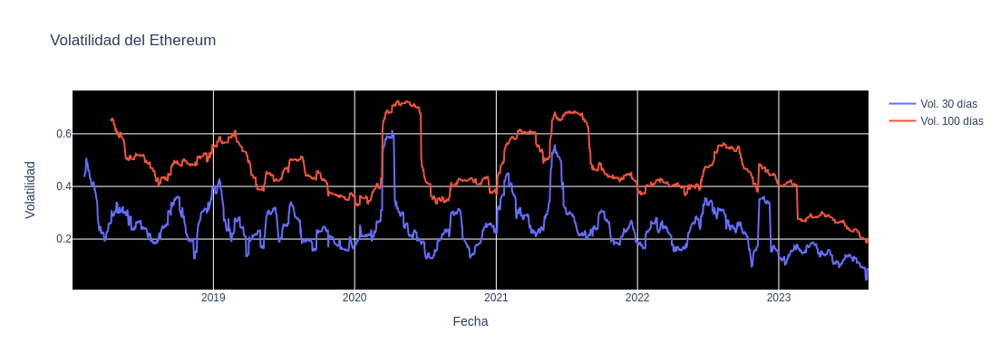

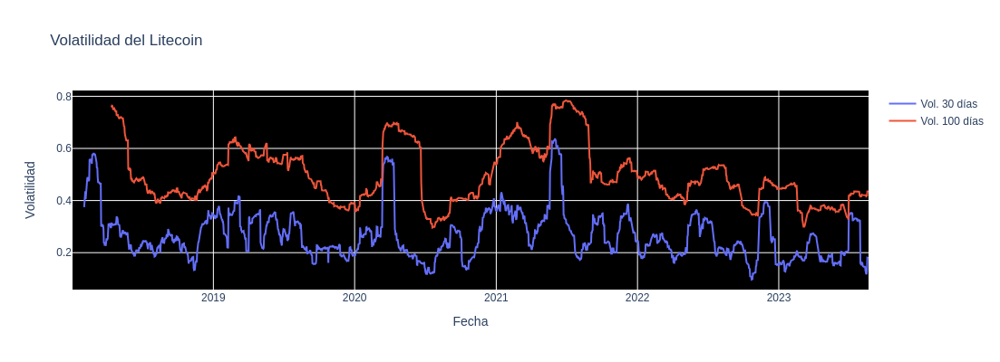

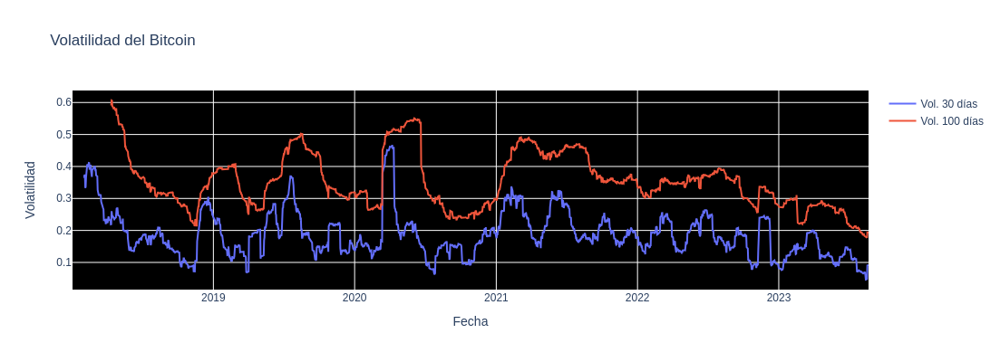

...

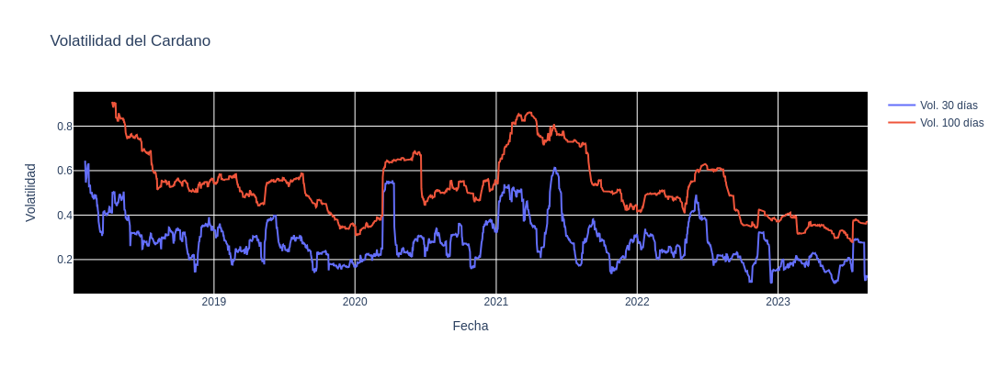

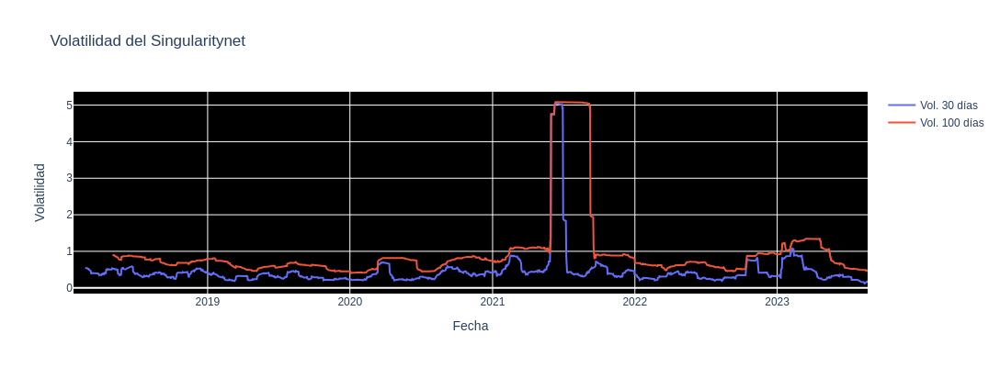

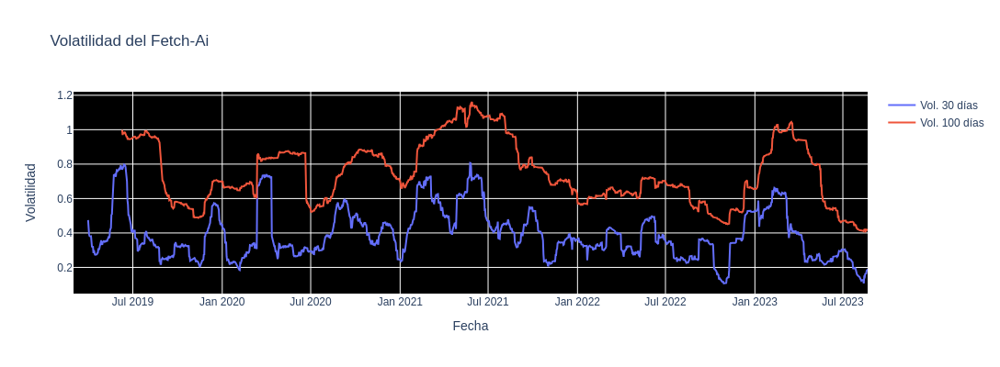

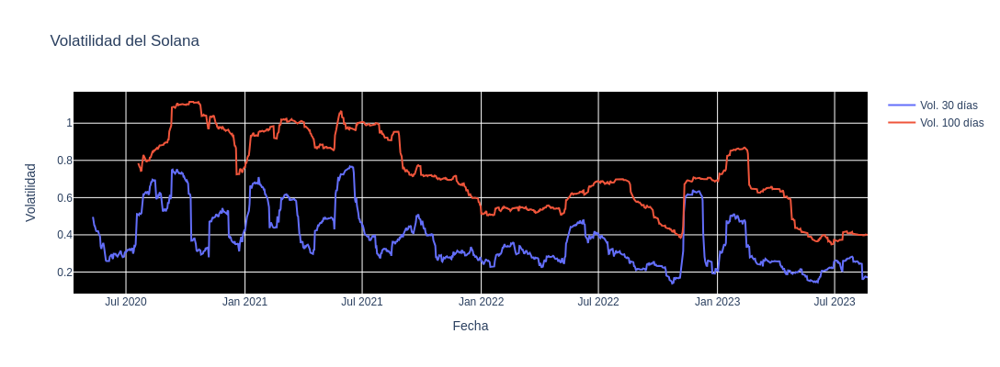

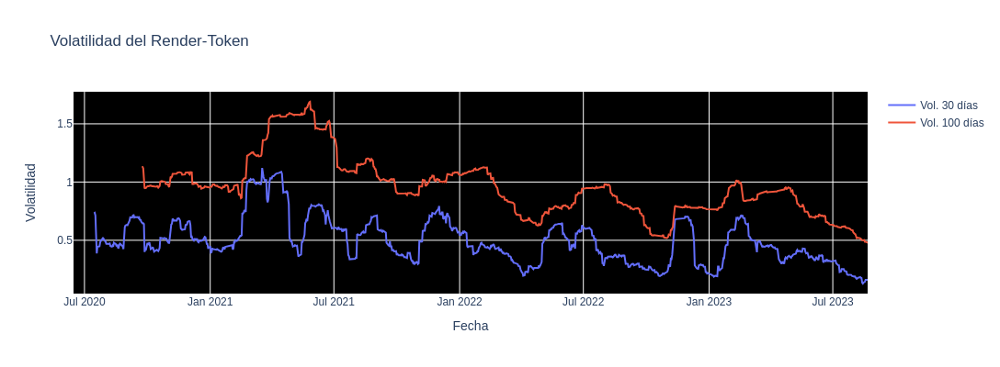

In [17]:
# Calcular la volatilidad 
for cry in df['name'].unique().tolist():
    df_vol = df[df['name'] == cry]
    df_30 = df_vol["prices"].pct_change().rolling(30).std() * np.sqrt(30) # Volatilidad implícita con periodo de 30 días
    df_100 = df_vol["prices"].pct_change().rolling(100).std() * np.sqrt(100) # Volatilidad implícita con periodo de 100 días

    # Graficar la volatilidad 
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df_vol.index, y=df_30, name="Vol. 30 días"))
    fig.add_trace(go.Scatter(x=df_vol.index, y=df_100, name="Vol. 100 días"))
    fig.update_layout(
        title=f"Volatilidad del {cry}",
        xaxis_title="Fecha",
        yaxis_title="Volatilidad",
        height=400,
    )
    fig.update_layout(
        plot_bgcolor ='black'
    )
    fig.show()

#### Observaciones
La volatilidad implícita de un activo financiero se interpreta como una medida de las expectativas del mercado sobre la variabilidad futura de ese activo. En el caso que nos ocupa, observamos que la volatilidad en los diferentes cryptos varia entre los rangos de 0.02 y 1 se puede esperar que el activos con volatilidad implícita mas altas se espera que tenga una mayor variabilidad en su precio en el futuro que las criptos con volatilidad implícita bajas. Esto significa que los inversores consideran que el activo con volatilidad implícita de mas altas tiene un mayor riesgo y una mayor incertidumbre en su comportamiento futuro que el activo con volatilidad implícita bajas. Sin embargo, es importante tener en cuenta que la volatilidad implícita es una medida basada en las **expectativas del mercado** y no garantiza que esas expectativas se cumplan en el futuro. Además, la volatilidad implícita puede variar a lo largo del tiempo y puede ser influenciada por diversos factores, como indicadores macroeconómicos, políticas monetarias.

Si se desea utilizar este indicador para la toma de decisiones en inversión de criptomonedas les presento algunas sugerencias.

1. **Identificar oportunidades de trading**: La volatilidad implícita puede ayudar a identificar oportunidades de trading en criptomonedas. Si la volatilidad implícita es alta, puede indicar que se esperan grandes fluctuaciones en el precio de la criptomoneda en el futuro, lo que puede ser una oportunidad para comprar o vender en el momento adecuado.
2. **Evaluar el riesgo**: La volatilidad implícita también puede ser utilizada para evaluar el riesgo de una inversión en criptomonedas. Si la volatilidad implícita es alta, puede indicar que el activo tiene un mayor riesgo y una mayor incertidumbre en su comportamiento futuro, lo que puede ser un factor a considerar al tomar decisiones de inversión.
3. **Valorar opciones financieras**: La volatilidad implícita es un factor clave en la valoración de opciones financieras en criptomonedas. Los inversores pueden utilizar la volatilidad implícita para estimar el precio de las opciones y determinar si son una inversión atractiva.
4. **Identificar tendencias**: La volatilidad implícita también puede ser utilizada para identificar tendencias en el mercado de criptomonedas. Si la volatilidad implícita es alta, puede indicar que el mercado está experimentando una mayor incertidumbre y que los inversores están tomando posiciones más defensivas.

### Distribución del retorno diario por Cryptomoneda
La intención de los siguientes gráficos es mostrar como es la distribución de cada una de las criptomonedas objeto de este estudio con la finalidad de entender la frecuencia y la magnitud de los cambios en los precios diarios del activo digital.

In [ ]:
import plotly.subplots as sp
for cry in df['name'].unique().tolist():
    df_ret = df[df['name'] == cry]
    # Crear subplots
    fig = sp.make_subplots(rows=2, cols=1, shared_xaxes=True ,vertical_spacing=0.09)
    # Crear un histograma de los retornos diarios
    histogram_fig = px.histogram(df_ret, x='daily_return', nbins=50, labels={'daily_return': 'Retorno Diario'},color_discrete_sequence=['rgb(40, 116, 166)'], height=600, width=400)
    # Crear un boxplot de los retornos diarios
    boxplot_fig = px.box(df_ret, x='daily_return', labels={'daily_return': 'Retorno Diario'},color_discrete_sequence=['rgb(40, 116, 166)'])
    # Agregar las gráficas al subplot
    fig.add_trace(histogram_fig['data'][0], row=1, col=1)
    fig.add_trace(boxplot_fig['data'][0], row=2, col=1)
    # Actualizar el layout del subplot
    fig.update_layout(
        title=f'Distribución del Retorno Diario para {cry}',
        xaxis_title="Retorno diario",
        yaxis_title="Cantidad de días",
        plot_bgcolor='black',
        height=600,
        )
    # Mostrar el gráfico
    fig.show()

## <span style = "color:green">FIN EDA</span>